# Free spoken digit dataset

# Dataset loading

In [1]:
import os
import re
import scipy.io.wavfile as wav
import numpy as np

sampling_rate = 8000

# Development dataset
dev_path = './free-spoken-digit/dev'
dev_X = []
dev_y = []

for wav_file in os.listdir(dev_path):
    dev_y.append(re.split('[._]', wav_file)[1])
    dev_X.append(wav.read(dev_path + '/' + wav_file)[1])
    if wav.read(dev_path + '/' + wav_file)[0] != sampling_rate:
        print('Sampling error in: ' + dev_path + '/' + wav_file)

# Evaluation dataset
eval_path = './free-spoken-digit/eval'
eval_X = []

for wav_file in os.listdir(eval_path):
    eval_X.append(wav.read(eval_path + '/' + wav_file)[1])
    if wav.read(eval_path + '/' + wav_file)[0] != sampling_rate:
        print('Sampling error in: ' + eval_path + '/' + wav_file)

# Data exploration

In [2]:
import matplotlib.pyplot as plt

# Signals: first visualization
fig, ax = plt.subplots(2, 3, figsize=(14,4))
for i in range(2):
    for j in range(3):
        ax[i][j].plot(dev_X[i*3+j])
plt.tight_layout()
plt.show()

<Figure size 1400x400 with 6 Axes>

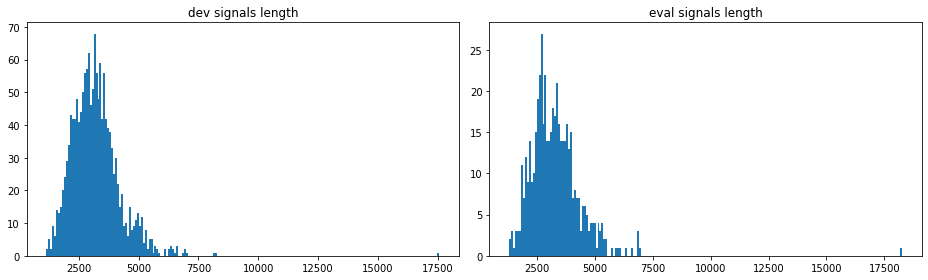

In [3]:
# Signal vectors size
dev_sizes = [el.size for el in dev_X]
eval_sizes = [el.size for el in eval_X]

fig, ax = plt.subplots(1,2,figsize=(13,4))
ax[0].hist(dev_sizes, bins=200)
ax[0].set_title('dev signals length')
ax[1].hist(eval_sizes, bins=200)
ax[1].set_title('eval signals length')

plt.tight_layout()
plt.show()

In [4]:
# Developement dataset
X_d = np.array(dev_X)
y_d = np.array(dev_y)

# Evaluation dataset
X_e = np.array(eval_X)

In [5]:
print(X_d.shape)
print(y_d.shape)
print(X_e.shape)

(1500,)
(1500,)
(500,)


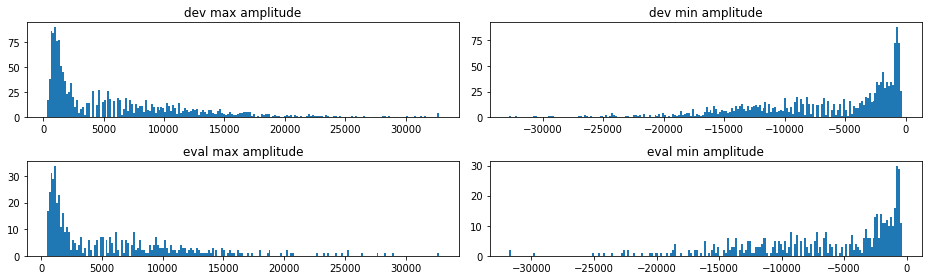

In [6]:
# Max and min amplitude for each signal
dev_max_amp = [np.max(sig) for sig in X_d]
dev_min_amp = [np.min(sig) for sig in X_d]
eval_max_amp = [np.max(sig) for sig in X_e]
eval_min_amp = [np.min(sig) for sig in X_e]

fig, ax = plt.subplots(2,2,figsize=(13,4))
ax[0][0].hist(dev_max_amp, bins=200)
ax[0][0].set_title('dev max amplitude')
ax[0][1].hist(dev_min_amp, bins=200)
ax[0][1].set_title('dev min amplitude')

ax[1][0].hist(eval_max_amp, bins=200)
ax[1][0].set_title('eval max amplitude')
ax[1][1].hist(eval_min_amp, bins=200)
ax[1][1].set_title('eval min amplitude')

plt.tight_layout()
plt.show()

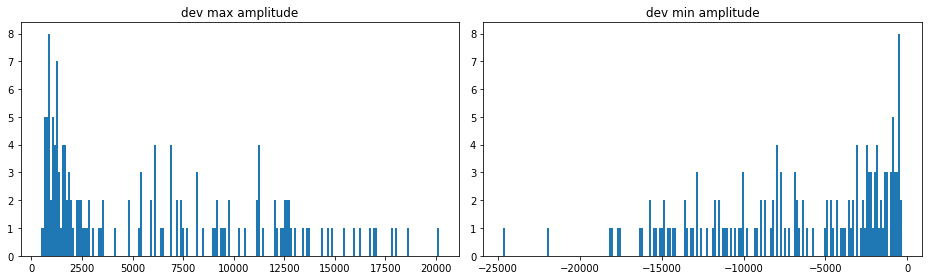

In [7]:
# Max and min amplitude within a class
sig_class = '7'

dev_max_amp = [np.max(sig) for sig in X_d[y_d == sig_class]]
dev_min_amp = [np.min(sig) for sig in X_d[y_d == sig_class]]

fig, ax = plt.subplots(1,2,figsize=(13,4))
ax[0].hist(dev_max_amp, bins=200)
ax[0].set_title('dev max amplitude')
ax[1].hist(dev_min_amp, bins=200)
ax[1].set_title('dev min amplitude')

plt.tight_layout()
plt.show()

#### Normalization required!
Amplitude isn't constant in the same class

In [8]:
# Amplitude rescaled to 1
for i in range(X_d.size):
    X_d[i] = X_d[i] / np.max(np.abs(X_d[i]))

for i in range(X_e.size):
    X_e[i] = X_e[i] / np.max(np.abs(X_e[i]))

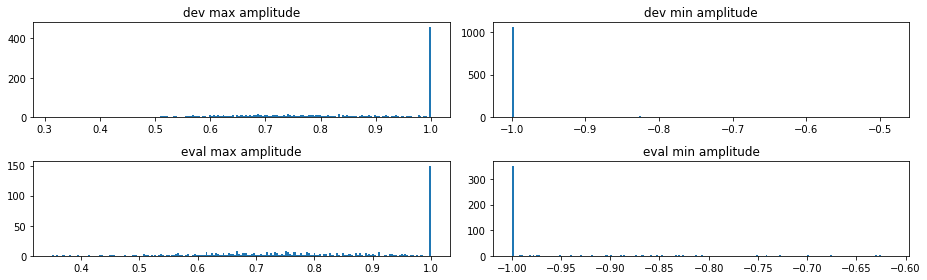

In [9]:
# Max and min amplitude for each signal
dev_max_amp = [np.max(sig) for sig in X_d]
dev_min_amp = [np.min(sig) for sig in X_d]
eval_max_amp = [np.max(sig) for sig in X_e]
eval_min_amp = [np.min(sig) for sig in X_e]

fig, ax = plt.subplots(2,2,figsize=(13,4))
ax[0][0].hist(dev_max_amp, bins=200)
ax[0][0].set_title('dev max amplitude')
ax[0][1].hist(dev_min_amp, bins=200)
ax[0][1].set_title('dev min amplitude')

ax[1][0].hist(eval_max_amp, bins=200)
ax[1][0].set_title('eval max amplitude')
ax[1][1].hist(eval_min_amp, bins=200)
ax[1][1].set_title('eval min amplitude')

plt.tight_layout()
plt.show()

## Estrazione della parola nel file audio
L'obiettivo è quello di trimmare l'audio all'inizio e fine esatti di quando viene pronunciata la parola.

La lunghezza di una parola è sicuramente significativa sul suo contenuto ed eccetera...

Inoltre si può iterare questa tecnica per isolare delle sotto parti dell'onda (da provare).

### Cumulative distribution function

In [10]:
def CDF(v):
    """Given a vector, returns the CDF vector of it"""
    cdf = np.zeros(v.size)
    cdf[0] = v[0]
    for i in range(1,v.size):
        cdf[i] = cdf[i-1] + v[i] 
    return cdf / np.sum(v)

### Alte funzioni utili per trimmare

In [11]:
def lower_cdf_area(cdf, threshold=.01):
    """Ritorna l'indice della cdf per cui l'area a sx vale 'threshold'"""
    area_tot = np.sum(cdf)
    area = area_tot * threshold
    
    lower = 0
    upper = cdf.size - 1
    
    # Lower area
    a = 0
    for i in range(cdf.size):
        if a >= area/2:
            break
        a += cdf[i]   
        
    return i

In [12]:
def lower_cdf_perc(cdf, threshold=.01):
    """Ritorna l'indice della cdf per cui essa vale 'threshold'"""
    i = 0
    while cdf[i] < threshold and i < cdf.size:
        i += 1
    return i

### Moving average
E' molto efficace per ridurre il sumore su un segnale se calcolata con finistra piccola

In [13]:
def moving_average(a, n=10):
    "Media mobile"
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

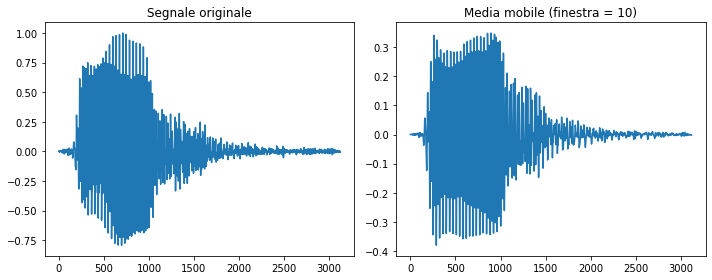

In [14]:
# Es
fig, ax = plt.subplots(1,2,figsize=(10,4))
ax[0].plot(X_d[0])
ax[0].set_title('Segnale originale')
ax[1].plot(moving_average(X_d[0],10))
ax[1].set_title('Media mobile (finestra = 10)')

plt.tight_layout()
plt.show()

## Pipeline: trim del segnale
1. Pulizia del segnale mediante il calcolo della media mobile con finestra = 10
2. Modulo della media mobile e filtraggio di tutte le componenti con ampiezza minore del 12%. Questo numero si ottiene facendo tuning e osservando che è buono perchè non riduce la parte parlata, ma rimuove il rumore residuo.
3. Calcolo della CDF della funzione ottenuta
4. Il segnale viene troncato per gli indici in cui la sua CDF è minore o maggiore di .0025 (via tuning).

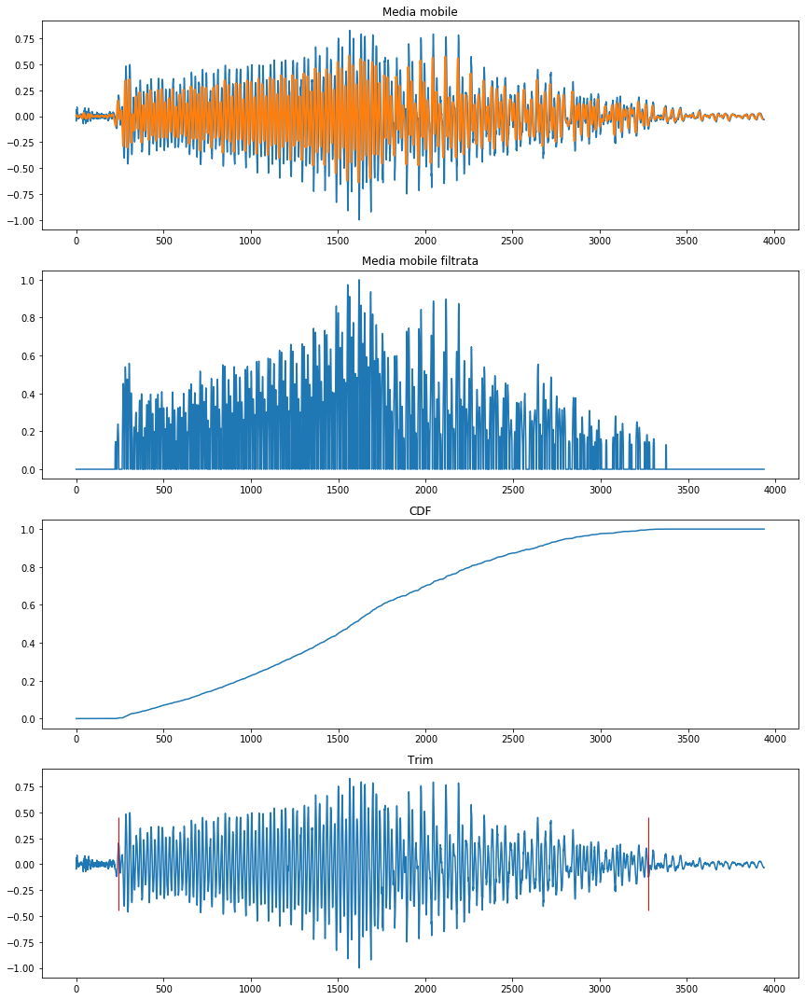

In [15]:
# Es pipeline

fig, ax = plt.subplots(4,1,figsize=(12,15))

# Segnale
sig = X_d[5] #5

# moving avg
mov_avg = moving_average(sig, 10)
ax[0].plot(sig)
ax[0].plot(mov_avg, linewidth=2)
ax[0].set_title('Media mobile')

# abs(mov avg) filtered
mov_avg_abs = np.abs(mov_avg)
mov_avg_abs = mov_avg_abs/np.max(mov_avg_abs)
mov_avg_abs = np.where(mov_avg_abs < .12, 0, mov_avg_abs) #.1 buono
ax[1].plot(mov_avg_abs)
ax[1].set_title('Media mobile filtrata')

# cdf
cdf = CDF(mov_avg_abs)
ax[2].plot(cdf)
ax[2].set_title('CDF')

#upper & lower percentuali
lower_p = lower_cdf_perc(cdf, threshold=.0025)
upper_p = cdf.size - 1 - lower_cdf_perc(np.flip(1-cdf), threshold=.0025)

# segnale trimmato
ax[3].plot(sig)
ax[3].plot(lower_p, 0, '|r', markersize=100)
ax[3].plot(upper_p, 0, '|r', markersize=100)
ax[3].set_title('Trim')

plt.tight_layout()
plt.show()

In [16]:
def upper_lower(sig):
    # moving avg
    mov_avg = moving_average(sig, 10)
    
    # abs(mov avg) filtered
    mov_avg_abs = np.abs(mov_avg)
    mov_avg_abs = mov_avg_abs/np.max(mov_avg_abs)
    mov_avg_abs = np.where(mov_avg_abs < .12, 0, mov_avg_abs) #.1 buono
    
    # cdf
    cdf = CDF(mov_avg_abs)
    
    # upper & lower aree
    #lower = lower_cdf_area(cdf, threshold=1e-5)
    #upper = cdf.size - 1 - lower_cdf_area(np.flip(1-cdf), threshold=31e-5)  #3e-4 buono, 32e-5 troppo
    
    # Si osserva che upper & lower percentuali è più flessibile della versione sulle aree!
    
    # upper & lower percentuali
    lower = lower_cdf_perc(cdf, threshold=.0025)
    upper = cdf.size - 1 - lower_cdf_perc(np.flip(1-cdf), threshold=.0025)
    
    return upper,lower

### Esempio su 50 segnali

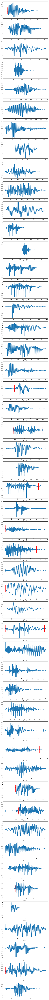

In [17]:
n_sig = 50
n_grafici_per_sig = 1
n_plot = n_sig * n_grafici_per_sig
fig, ax = plt.subplots(n_plot,1,figsize=(10,4*n_plot))

for i in range(0,n_plot,n_grafici_per_sig):
    sig = X_d[i//n_grafici_per_sig]
    
    upper, lower = upper_lower(sig)
    
    # segnale trimmato
    ax[i].plot(sig)
    ax[i].plot(lower, 0, '|r', markersize=100)
    ax[i].plot(upper, 0, '|r', markersize=100)
    ax[i].set_title('Signal: ' + str(i))

plt.tight_layout()
plt.show()

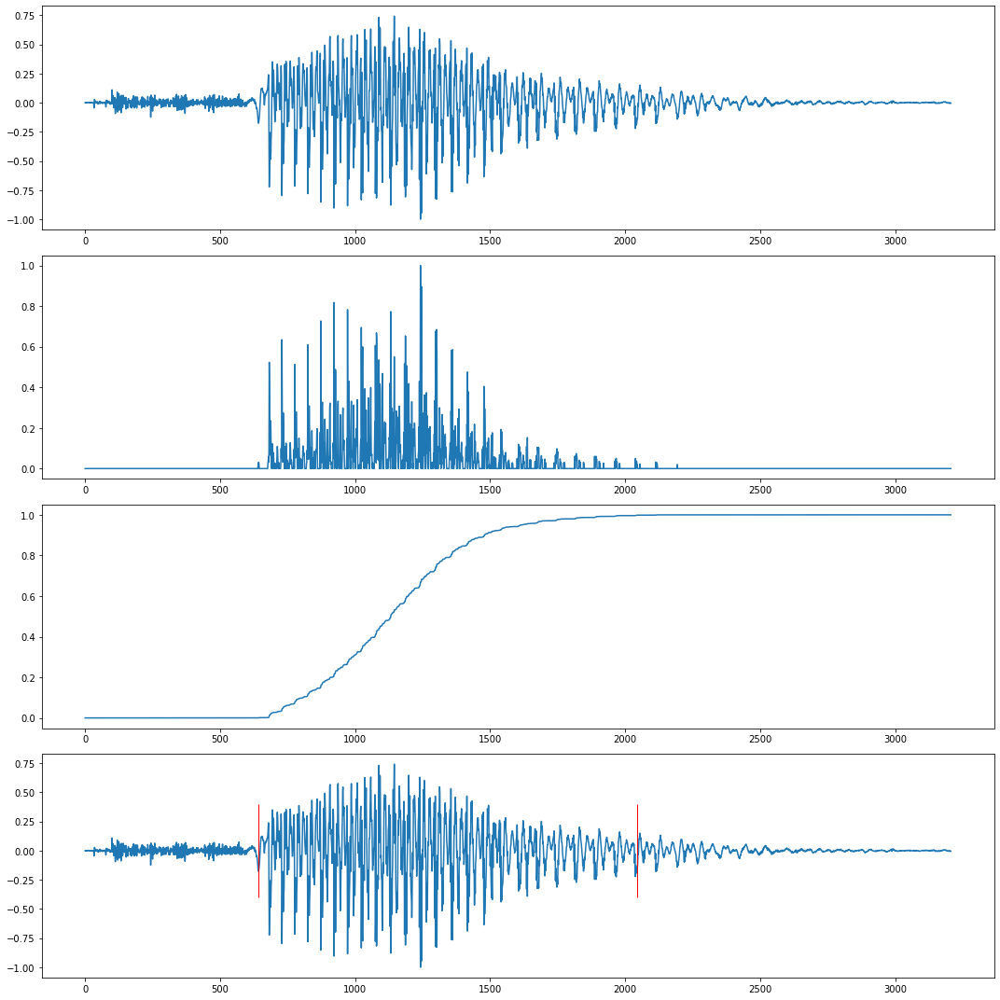

In [18]:
fig, ax = plt.subplots(4,1,figsize=(15,15))
sig = dev_X[49]
sig = sig / np.max(np.abs(sig))

ax[0].plot(sig)

sq = sig**2
sq = sq / np.max(sq)
sq = np.where(sq < .02, 0, sq)
ax[1].plot(sq)


cdf = CDF(sq)
ax[2].plot(cdf)

thre = .0002
lower = lower_cdf_perc(cdf, threshold=.0002)
upper = cdf.size - 1 - lower_cdf_perc(np.flip(1-cdf), threshold=.002)

ax[3].plot(sig)
ax[3].plot(lower, 0, '|r', markersize=100)
ax[3].plot(upper, 0, '|r', markersize=100)

plt.tight_layout()
plt.plot();

### Trim del dataset

In [19]:
for i in range(X_d.size):
    upp, low = upper_lower(X_d[i])
    X_d[i] = X_d[i][low:upp+1]

In [20]:
for i in range(X_e.size):
    upp, low = upper_lower(X_e[i])
    X_e[i] = X_e[i][low:upp+1]

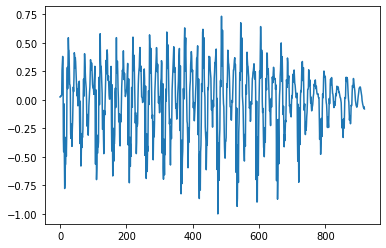

In [21]:
plt.plot(X_d[7]);

### Controllo la lunghezza dei segnali e filtro eventuali anomali

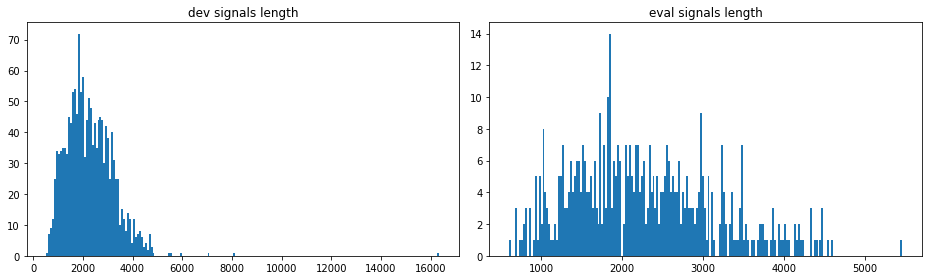

In [22]:
# Signal vectors size
dev_sizes = [el.size for el in X_d]
eval_sizes = [el.size for el in X_e]

fig, ax = plt.subplots(1,2,figsize=(13,4))
ax[0].hist(dev_sizes, bins=200)
ax[0].set_title('dev signals length')
ax[1].hist(eval_sizes, bins=200)
ax[1].set_title('eval signals length')

plt.tight_layout()
plt.show()

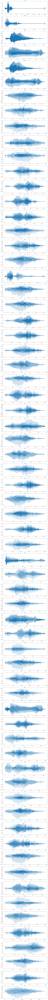

In [23]:
# Com'è possibile che ci siano ancora segnali lunghi più di 4000?
i_lunghi = sorted([(i,X_d[i].size) for i in range(X_d.size) if X_d[i].size > 4000], key=lambda x: -x[1])
i_lunghi = list(map(lambda x:x[0],i_lunghi))
lunghi = len(i_lunghi)

fig, ax = plt.subplots(lunghi,1,figsize=(13,4*lunghi))

for j,i in enumerate(i_lunghi):
    u,l = upper_lower(dev_X[i])
    ax[j].plot(dev_X[i])
    ax[j].plot(l,0,'r|',markersize=100)
    ax[j].plot(u,0,'r|',markersize=100)
    ax[j].set_title(i)
    
plt.tight_layout()
plt.plot();

### Scarto i segnali più lunghi di 4500

In [24]:
# Conteggio scartati
max_size = 4500
print(f'dev X scartati: {len([el.size for el in X_d if el.size > max_size])/len(X_d)*100:.2f} %')
print(f'eval X scartati: {len([el.size for el in X_e if el.size > max_size])/len(X_e)*100:.2f} %')

dev X scartati: 1.40 %
eval X scartati: 0.60 %


In [25]:
# Filtraggio
dev_idx = [i for i in range(X_d.size) if X_d[i].size > max_size]
X_d = np.delete(X_d, dev_idx)
y_d = np.delete(y_d, dev_idx)
X_e = np.delete(X_e, [i for i in range(X_e.size) if X_e[i].size > max_size])

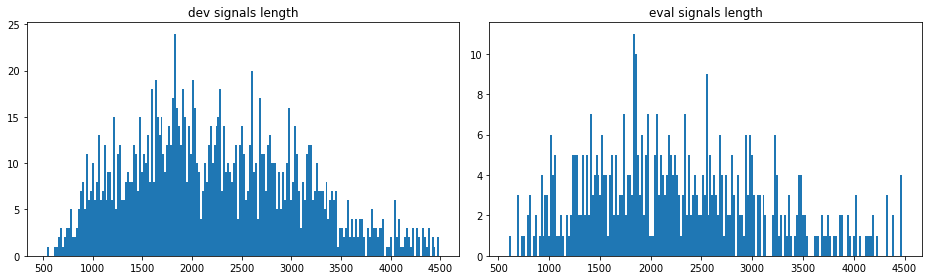

In [26]:
# Signal vectors size
dev_sizes = [el.size for el in X_d]
eval_sizes = [el.size for el in X_e]

fig, ax = plt.subplots(1,2,figsize=(13,4))
ax[0].hist(dev_sizes, bins=200)
ax[0].set_title('dev signals length')
ax[1].hist(eval_sizes, bins=200)
ax[1].set_title('eval signals length')

plt.tight_layout()
plt.show()

## Identificazione delle principali 'gobbe' del segnale

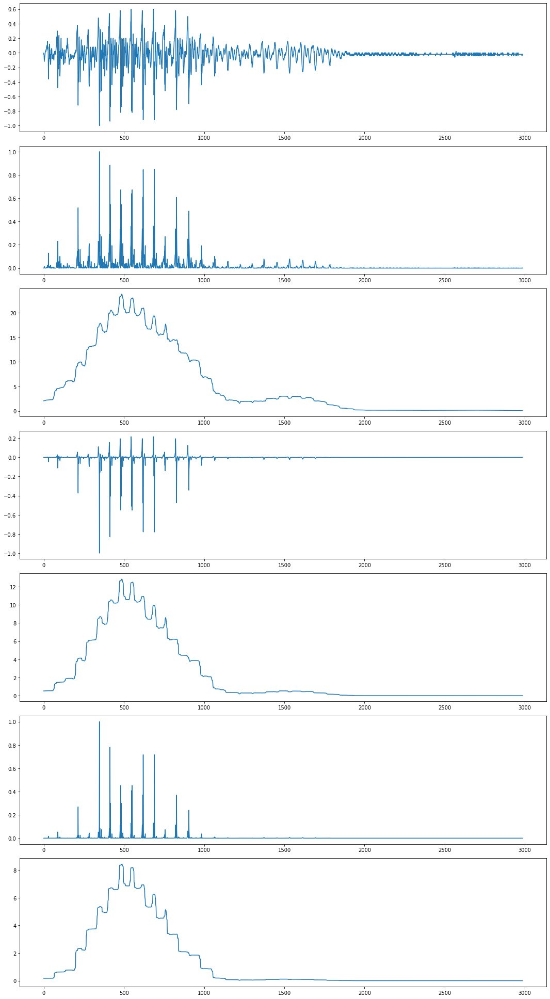

In [27]:
fig, ax = plt.subplots(7,1,figsize=(15,27))
sig = dev_X[829] #dev_X[i_lunghi[3]]
sig = sig / np.max(np.abs(sig))

win = sig.size // 10

ax[0].plot(sig)

#mov_avg = moving_average(sig,10)
#mov_avg = mov_avg/np.max(np.abs(mov_avg))

# è il miogliore perchè non attenua troppo le 'gobbe' minori, ma sempre importanti (vedi dev_X[688])
ax[1].plot(sig**2)

ax[2].plot(np.convolve(sig**2,np.ones(win), mode='same'))

#mov_avg = mov_avg**3#moving_average(np.abs(sig),10)
ax[3].plot(sig**3)

ax[4].plot(np.convolve(np.abs(sig**3),np.ones(win), mode='same'))

ax[5].plot(sig**4)

ax[6].plot(np.convolve(sig**4,np.ones(win), mode='same'))

plt.tight_layout()
plt.plot();

#### Funzioni utili

In [28]:
def zero_crossing_idx(v):
    tol = 1e-8
    idx = []
    i = 0
    
    while np.abs(v[i]) < tol and i < v.size:
        i += 1
    prec = v[i]
    
    for j in range(i+1,v.size):
        if np.abs(v[j]) < tol:
            continue
            
        if v[j] * prec < 0:
            idx.append(j)
        prec = v[j]
    return idx

In [29]:
def der(sig, sampl_rate=8000):
    t = 1/sampl_rate
    d = np.zeros(sig.size - 1)
    for i in range(sig.size - 1):
        d[i] = (sig[i+1]-sig[i])/t
    return d

In [30]:
def staz(sig):
    """Calcola i punti stazionari del segnale"""
    return zero_crossing_idx(der(sig))

In [31]:
def massimi(sig, window=None):
    """Calcola i massimi del segnale"""
    if window is None:
        window = sig.size // 30
        
    d = der(sig)
    st = staz(sig)
    m = []
    
    for s in st:
        # media della derivata a sx (in una certa finestra)
        d_sx = np.average(d[s-window:s])
        # media della derivata a dx
        d_dx = np.average(d[s:s+window])
        
        if d_sx > 0 and d_dx < 0:
            m.append(s)
    
    # prima è massimi più grandi
    m = sorted(m,key=lambda x: -sig[x])
    
    # filtraggio massimi troppo vicini
    window = 300 #sig.size // 30
    m_filt = []
    m_filt.append(m[0])
    for i in m:
        if len([j for j in m_filt if np.abs(i - j) > window]) == len(m_filt):
            m_filt.append(i)
    return m_filt

### Pipeline calcolo gobbe
0. Normalizzazione del segnale alla sua ampiezza massima
1. Calcolo del quadrato del segnale: permette di enfatizzare le 'gobbe'. Potenze maggiori (3,4,5) in alcuni casi sono troppo aggressive e stravolgono il segnale. Il quadrato è il migliore perchè non attenua troppo le 'gobbe' minori, ma sempre importanti (vedi `dev_X[688]`).
2. Convoluzione per una 'porta' di ampiezza e altezza 1.3. 
3. Smoothing del segnale ottenuto: Trasformata di fourier e filtraggio della stessa. Il filtraggio è fatto sia tagliando le frequenze più altre che le frequenza con potenza inferiore al 10%
4. Ricostruzione del segnale
5. Calcolo dei massimi. Vengono filtrati quelli più vicini di $300\,T_{c}$ secondi e quelli sotto al 20% della potenza 


Dopo aver osservato i risultati ho notato che è meglio fare il segnale alla quarta e non al quadrato

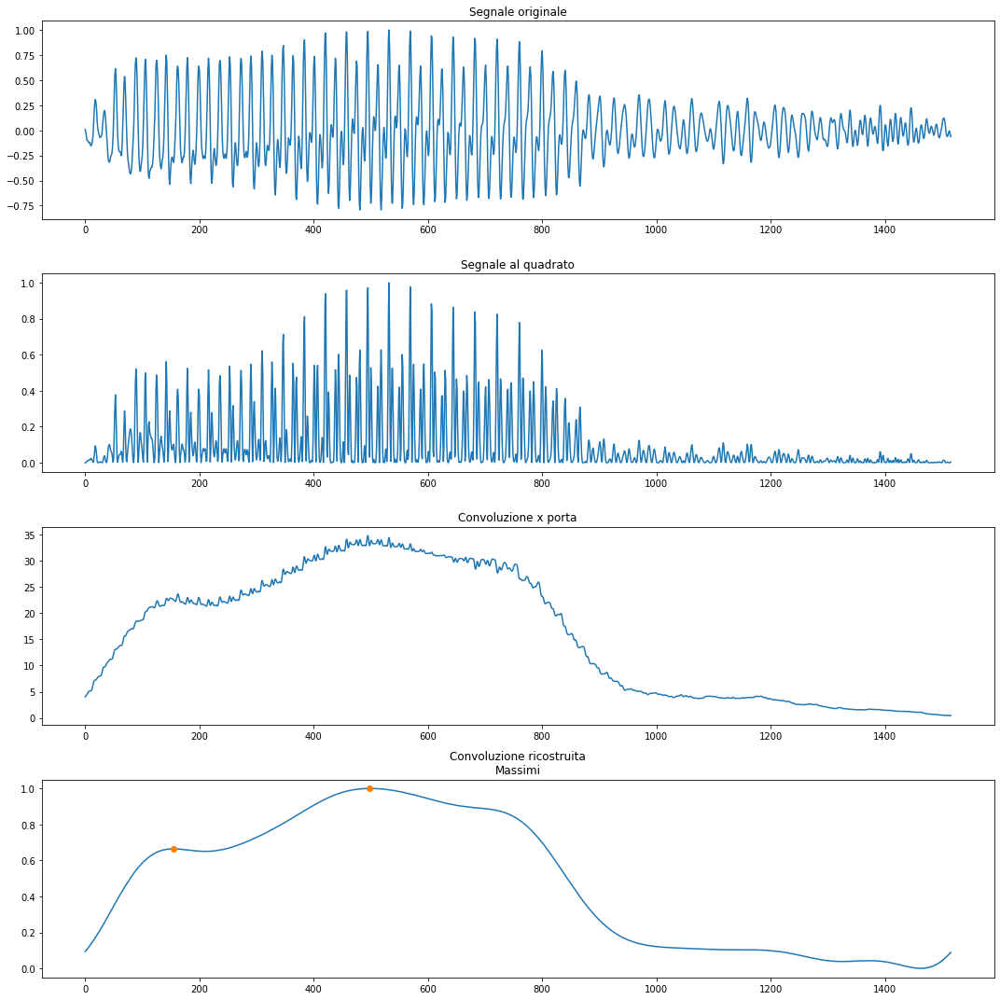

In [32]:
from scipy import fftpack

fig, ax = plt.subplots(4,1,figsize=(15,15))
sig = X_d[0] #dev_X[i_lunghi[3]] #621
sig = sig / np.max(np.abs(sig))

win = sig.size // 10

ax[0].plot(sig)
ax[0].set_title('Segnale originale')

ax[1].plot(sig**2)
ax[1].set_title('Segnale al quadrato')

conv = np.convolve(sig**2,np.ones(win), mode='same')

ax[2].plot(conv)
ax[2].set_title('Convoluzione x porta')

# Trasformata fi fourier
fft = fftpack.fft(conv)
freq = fftpack.fftfreq(fft.size, d=1/8000)

# filtro potenza minima in frequenza
spectrum = np.abs(fft)#fft**2
filt_fft = fft.copy()
#cutoff_idx = spectrum < (spectrum.max()/10)
#cutoff_idx = spectrum < (spectrum.max()/50)
#filt_fft[cutoff_idx] = 0

# filtro passa basso
t = 10
filt_fft[t:filt_fft.size//2] = 0
filt_fft[filt_fft.size//2 +t:] = 0

# Segnale ricostruito
cv = np.real(fftpack.ifft(filt_fft))
cv = (cv - np.min(cv))
cv = cv / np.max(cv)

i_max = massimi(cv)
i_max = [i for i in i_max if cv[i] > .2]

ax[3].plot(cv)
ax[3].plot(i_max,cv[i_max],'o')
ax[3].set_title('Convoluzione ricostruita\nMassimi')

plt.tight_layout()
plt.plot();

In [33]:
def massimi_potenza(sig, window_max=None):
    """Calcola la posizione delle principali 'gobbe' del segnale"""
    
    # Normalizzazione
    sig = sig / np.max(np.abs(sig))

    win = sig.size // 10
    
    # Convoluzione del segnale alla quarta
    conv = np.convolve(sig**4,np.ones(win), mode='same')

    # Trasformata fi fourier
    fft = fftpack.fft(conv)
    freq = fftpack.fftfreq(fft.size, d=1/8000)

    # filtro potenza minima in frequenza
    spectrum = np.abs(fft)
    filt_fft = fft.copy()
    #cutoff_idx = spectrum < (spectrum.max()/10)
    #cutoff_idx = spectrum < (spectrum.max()/50)
    #filt_fft[cutoff_idx] = 0

    # filtro passa basso
    t = 10
    filt_fft[t:filt_fft.size//2] = 0
    filt_fft[filt_fft.size//2 +t:] = 0

    # Segnale ricostruito
    cv = np.real(fftpack.ifft(filt_fft))
    cv = (cv - np.min(cv))
    cv = cv / np.max(cv)

    i_max = massimi(cv,window=window_max)
    i_max = [i for i in i_max if cv[i] > .2]
    
    return np.array(i_max)

C:\Users\mette\Anaconda3\lib\site-packages\numpy\lib\function_base.py:392: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
C:\Users\mette\Anaconda3\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


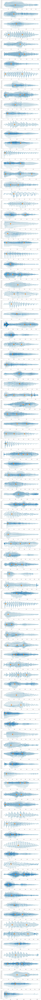

In [34]:
n_plot = 100
fig, ax = plt.subplots(n_plot,1,figsize=(15,4*n_plot))

for i in range(n_plot):
    sig = X_d[i]
    mas = massimi_potenza(sig)
    ax[i].plot(sig)
    ax[i].plot(mas,np.zeros(len(mas)),'o',markersize=20)

## Features extraction

Alcune features che posso estrarre sono:
- Durata del segnale nel tempo
- Percentili / CDF del segnale nel tempo
- Percentili / CDF del segnale nella frequenza

### Zero crossing rate

In [35]:
def zero_crossing_rate(v):
    count = 0
    i = 0
    
    while v[i] == 0 and i < v.size:
        i += 1
    prec = v[i]
    
    for j in range(i+1,v.size):
        if v[j] == 0:
            continue
            
        if v[j] * prec < 0:
            count += 1
        prec = v[j]
    return count

2


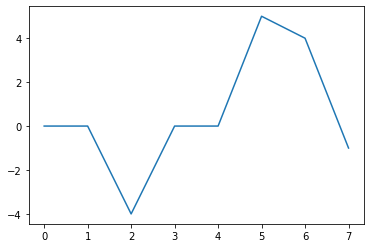

In [36]:
# Example
my_array = np.array([0,0,-4,0,0,5,4,-1]) # -> 2

print(zero_crossing_rate(my_array))
plt.plot(my_array);

## Frequency domain

In [37]:
from scipy import fftpack

def freq_domain(sig, sampling_rate=8000, cutoff=.2):
    """
    Return: bilateral_frequencies, bilateral_amplitude, bilateral_filtered_amplitude
    Note: power = np.abs(bilateral_amplitude)
          positive_frequencies = bilateral_frequencies[:bilateral_frequencies.size // 2]
    """
    time_step = 1/sampling_rate

    # The FFT of the signal
    sig_fft = fftpack.fft(sig)

    # And the power (sig_fft is of complex dtype)
    power = np.abs(sig_fft)

    # The corresponding frequencies
    sample_freq = fftpack.fftfreq(sig.size, d=time_step)
    
    # Removing high frequencies
    high_freq_fft = sig_fft.copy()
    high_freq_fft[(power / np.max(power)) < cutoff] = 0
    
    return sample_freq, sig_fft, high_freq_fft

### Autocorrelation: may reduce noise?
Autocorrelation is useful for finding repeating patterns in a signal, such as determining the presence of a periodic signal which has been buried under noise, or identifying the fundamental frequency of a signal which doesn't actually contain that frequency component, but implies it with many harmonic frequencies (Wikipedia 2006).

***Hence*: Autocorrelation is good to remove noise in the frequency domain**

In [38]:
def autocorrelation(x):
    autocorr = np.correlate(x, x, mode='full')
    autocorr = autocorr[autocorr.size//2:]
    autocorr = autocorr / np.max(autocorr)
    return autocorr

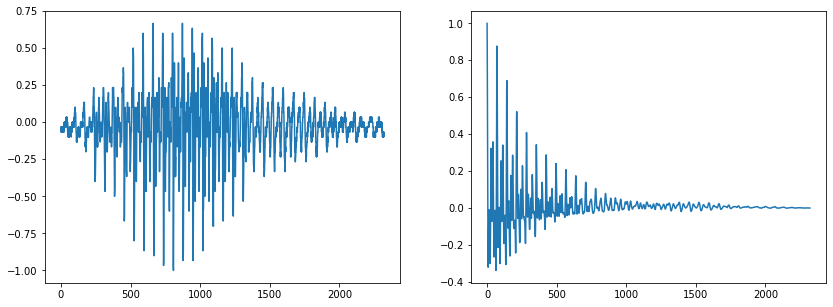

In [39]:
# Example
x = X_d[2]
autocorr = np.correlate(x, x, mode='full')
autocorr = autocorr[autocorr.size//2:]
autocorr = autocorr / np.max(autocorr)

fig, ax = plt.subplots(1,2,figsize=(14,5))

ax[0].plot(x)
ax[1].plot(autocorr)

plt.show()


### Average frequency domain per class

ValueError: operands could not be broadcast together with shapes (2258,) (2685,) 

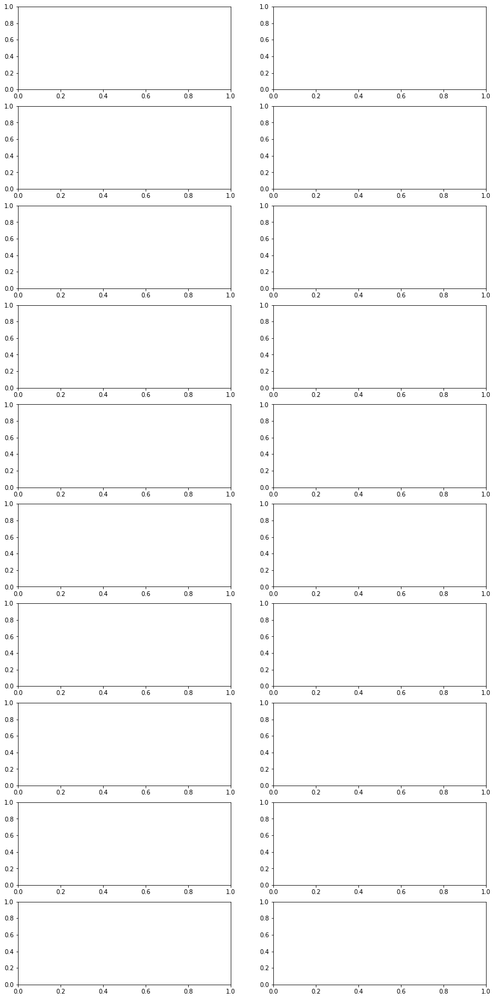

In [42]:
import seaborn as sns

fig, ax = plt.subplots(10, 2, figsize=(14, 30))

for cl in range(10):
    class_lab = str(cl)
    signals = X_d[y_d == class_lab]

    n_sig = 300

    mean_pot_sig = None

    for i, sig in enumerate(signals[:n_sig]):
        
        # Considero l'autocorrelazione
        sig = autocorrelation(sig)
        
        freq, freq_amp, filt_freq_amp = freq_domain(sig, sampling_rate)

        # Potenza
        filt_pot = np.abs(filt_freq_amp)
        pot = np.abs(freq_amp)

        mean_pot_sig = mean_pot_sig + filt_pot / n_sig if mean_pot_sig is not None else filt_pot / n_sig
        #mean_pot_sig = mean_pot_sig + filt_pot / n_sig if mean_pot_sig is not None else filt_pot / n_sig
    
    # Log transformation of signal power
    #mean_pot_sig = np.log(np.where(mean_pot_sig == 0, 0.1, mean_pot_sig))
    
    ax[cl][0].plot(freq[:mean_pot_sig.size//2], mean_pot_sig[:mean_pot_sig.size//2])
    ax[cl][0].set_title('Classe ' + class_lab + ': potenza media')
    
    sns.heatmap([mean_pot_sig[:2000]], ax=ax[cl][1]); 
    #sns.heatmap([mean_pot_sig[:mean_pot_sig.size//2]], ax=ax[cl][1]);
    ax[cl][1].set_title('Classe ' + class_lab + ': potenza heatmap')
        
    
plt.tight_layout()
plt.show()

### Spectral centroid

Spectral centroid:
\begin{equation}
C = \frac{\sum_i f_i\cdot |A(f_i)|}{\sum_j |A(f_j)|} = \sum_i f_i \cdot \frac{|A(f_i)|}{\sum_j |A(f_j)|}
\end{equation}
Dove:
- $f_i$ è la frequenza i-esima.
- $A(f_i)$ è l'intensità della frequenza i-esima.
- $|A(f_i)|$ è la potenza della frequenza i-esima.

**Osservazione:**
- $\frac{|A(f_i)|}{\sum_j |A(f_j)|} > 0 \,\, \forall i$
- $\sum_i \frac{|A(f_i)|}{\sum_j |A(f_j)|} = 1$ 

Dunque $\frac{|A(f_i)|}{\sum_j |A(f_j)|}$ si può considerare come la distribuzione di probabilità di una variabile aleatoria discreta $f$ e $C$ è il valore atteso.

Posso quindi calcolare anche la varianza di tale variabile aleatoria con la formula:

\begin{equation}
V = E(f^2) - C^2 = E(f^2) - E(f)^2 = 
\sum_i f_i^2 \cdot \frac{|A(f_i)|}{\sum_j |A(f_j)|} - \left(\sum_i f_i \cdot \frac{|A(f_i)|}{\sum_j |A(f_j)|}\right)^2
\end{equation}

In [41]:
def spectral_centroid(f, pot):
    return np.sum(f * pot) / np.sum(pot)

In [43]:
def spectral_centroid_var(f, pot, centroid=None):
    """Spectral centroid variance"""
    if centroid is None:
        centroid = spectral_centroid(f, pot)
    return np.sum(f**2 * pot) / np.sum(pot) - centroid

In [44]:
def spectral_info(sig):
    """
    Ritorna lo spectral centroid e la deviazione standard, 
    considerando la potenza come una distribuzione di probabilità
    """
    
    # Pulisco lo spettro del segnale
    sig = autocorrelation(sig)
    
    # Fourier transform
    fft = fftpack.fft(sig)
    freq = fftpack.fftfreq(fft.size, d=1/8000)
    
    # Filtraggio delle frequenze a intensità minore
    pot = np.abs(fft)
    fft = np.where(pot/np.max(pot) < .1, 0, fft)
    
    # Cut: solo le freq positive
    fft = fft[:fft.size//2]
    freq = freq[:freq.size//2]
    
    centroid = spectral_centroid(freq, np.abs(fft))
    std_dev_spectrum = np.sqrt(spectral_centroid_var(freq, np.abs(fft),centroid))
    
    return centroid, std_dev_spectrum

In [45]:
spectral_info(X_d[0])

(527.0715538297464, 557.2339078239443)

Queste due misure sono migliori a identificare la classe quando lo spettro è filtrato o no?

### Autocorrelation in the same class label

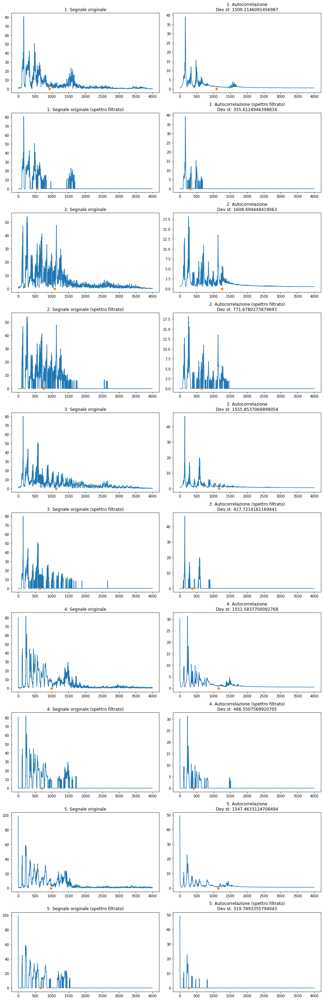

In [46]:
class_lab = '9'
signals = X_d[y_d == class_lab]

n_sig = 5
fig, ax = plt.subplots(2*n_sig, 2, figsize=(13, 40))

mean_pot_sig = None

for i, sig in zip(range(0,2*n_sig,2),signals[:n_sig]):
    
    # Original signal: FFT
    freq, f_amp, f_filt_amp = freq_domain(sig, cutoff=.1)
    f = freq[:freq.size // 2]
    f_a = f_amp[:f_amp.size // 2]
    f_filt_a = f_filt_amp[:f_filt_amp.size // 2]
    
    # Spettro completo
    ax[i][0].plot(f, np.abs(f_a))
    ax[i][0].plot(spectral_centroid(f, np.abs(f_a)), 0, 'o') # Spectral centroid
    ax[i][0].set_title(str(i//2+1) + ': Segnale originale')
    
    # Spettro filtrato
    ax[i+1][0].plot(f, np.abs(f_filt_a))
    ax[i+1][0].plot(spectral_centroid(f, np.abs(f_filt_a)), 0, 'o') # Spectral centroid
    ax[i+1][0].set_title(str(i//2+1) + ': Segnale originale (spettro filtrato)')
    
    
    # Autocorrelation: FFT
    freq_a, f_amp_a, f_filt_amp_a = freq_domain(autocorrelation(sig), cutoff=.1)
    f_aut = freq_a[:freq_a.size // 2]
    f_a_aut = f_amp_a[:f_amp_a.size // 2]
    f_filt_a_aut = f_filt_amp_a[:f_filt_amp_a.size //2]
    
    # Spettro completo
    ax[i][1].plot(f_aut, np.abs(f_a_aut))
    ax[i][1].plot(spectral_centroid(f_aut, np.abs(f_a_aut)), 0, 'o') # Spectral centroid
    ax[i][1].set_title(str(i//2+1) + ': Autocorrelazione' \
                       + '\nDev st: ' + str(np.sqrt(spectral_centroid_var(f_aut, np.abs(f_a_aut)))))
    
    # Spettro filtrato
    ax[i+1][1].plot(f_aut, np.abs(f_filt_a_aut))
    ax[i+1][1].plot(spectral_centroid(f_aut, np.abs(f_filt_a_aut)), 0, 'o') # Spectral centroid
    ax[i+1][1].set_title(str(i//2+1) + ': Autocorrelazione (spettro filtrato)' \
                       + '\nDev st: ' + str(np.sqrt(spectral_centroid_var(f_aut, np.abs(f_filt_a_aut)))))
    
plt.tight_layout()
plt.show()

Si osserva come il comportamento in frequenza dell'autocorrelazione sia molto meno rumoroso rispetto a quello del segnale originale.

Il centroide in frequenza individua correttamente le frequenze più importanti se:
1. Lo spettro è quello dell'autocorrelazione del segnale. Dunque è ripulito dal rumore
2. Lo spettro è filtrato con un `cutoff = 0.1`.

**Next step**: calcolare il centroide in frequenza per ciascun segnale e plottarne la distribuzione di ogni classe. Valutare la media e la varianza per ciascuna classe.
Questa procedura è una semplificazione dello spettro in fequenza.

## Percentili
Riguardano la distribuzione delle ampiezze di un segnale. 
Posso prenderne 10 per ogni segnale ad esempio: `range(5,96,10)`.

In [47]:
def time_percentiles(sig,p):
    perc = []
    for i in p:
        perc.append(np.percentile(sig,i))
    return np.array(perc)

In [48]:
def freq_percentiles(sig,p):
    fft = fftpack.fft(sig)
    fft = np.abs(fft[:fft.size//2])
    perc = []
    for i in p:
        perc.append(np.percentile(fft,i))
    return np.array(perc)

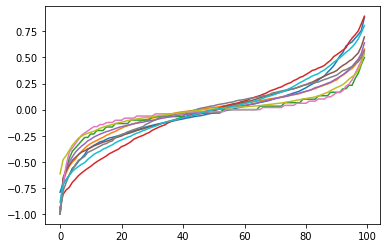

In [49]:
# Andamento dei percentili dei primi n segnali
fig, ax = plt.subplots()
for j in range(10):
    sig = X_d[j] # np.abs(X_d[j])
    perc = []
    for i in range(100):
        perc.append(np.percentile(sig,i))
    ax.plot(perc)

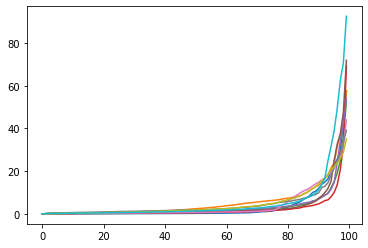

In [50]:
# Andamento dei percentili della potenza dei primi n segnali
fig, ax = plt.subplots()
for j in range(10):
    sig = X_d[j]
    fft = fftpack.fft(sig)
    fft = np.abs(fft[:fft.size//2])
    perc = []
    for i in range(100):
        perc.append(np.percentile(fft,i))
    ax.plot(perc)

### Gobbe dello spettro in frequenza: non funziona bene come nel tempo. Cestinato

In [51]:
def massimi_potenza_freq(sig, window_max=None):
    """Calcola la posizione delle principali 'gobbe' del segnale"""
    
    # Normalizzazione
    sig = sig / np.max(np.abs(sig))

    win = sig.size // 50
    
    # Convoluzione del segnale alla quarta
    conv = np.convolve(sig,np.ones(win), mode='same')

    # Trasformata fi fourier
    fft = fftpack.fft(conv)
    freq = fftpack.fftfreq(fft.size, d=1/8000)

    # filtro potenza minima in frequenza
    spectrum = np.abs(fft)
    filt_fft = fft.copy()
    #cutoff_idx = spectrum < (spectrum.max()/10)
    #cutoff_idx = spectrum < (spectrum.max()/50)
    #filt_fft[cutoff_idx] = 0

    # filtro passa basso
    t = 10
    filt_fft[t:filt_fft.size//2] = 0
    filt_fft[filt_fft.size//2 +t:] = 0

    # Segnale ricostruito
    cv = np.real(fftpack.ifft(filt_fft))
    cv = (cv - np.min(cv))
    cv = cv / np.max(cv)

    i_max = massimi(cv,window=window_max)
    i_max = [i for i in i_max if cv[i] > .2]
    
    return np.array(i_max)

C:\Users\mette\Anaconda3\lib\site-packages\numpy\lib\function_base.py:392: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
C:\Users\mette\Anaconda3\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


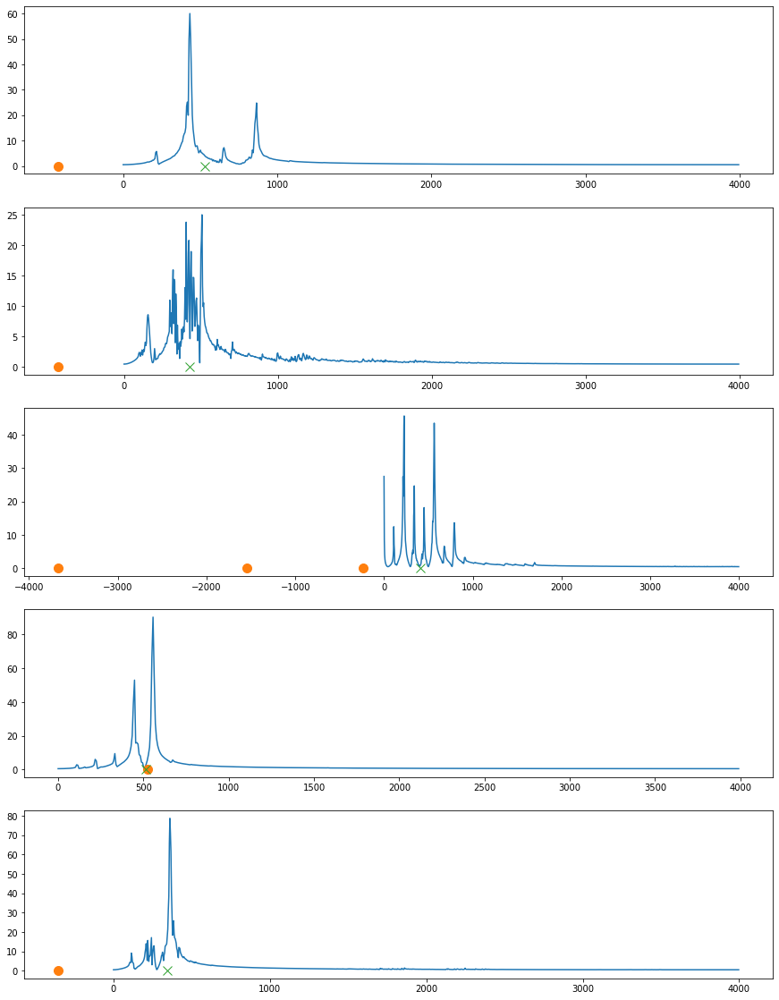

In [52]:
n_plot = 5
fig, ax = plt.subplots(n_plot,1,figsize=(15,4*n_plot))

for i in range(n_plot):
    sig = autocorrelation(X_d[i])
    
    fft = fftpack.fft(sig)
    freq = fftpack.fftfreq(fft.size, d=1/8000)
    sig = np.abs(fft[:fft.size//2])
    
    mas = massimi_potenza_freq(sig,30)
    ax[i].plot(freq[:freq.size//2],sig)
    l = freq[freq.size//2] / sig.size
    ax[i].plot(l*mas,np.zeros(len(mas)),'o',markersize=10)
    ax[i].plot(spectral_centroid(freq[:freq.size//2],np.where(sig/np.max(sig) < .1, 0, sig)),0,'x',markersize=10)

### Spectral Rolloff
It is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.

In pratica è una versione della banda al x% di energia.

In [53]:
def spectral_rolloff(sig, threshold=.9):
    """Return the spectral rolloff"""
    if threshold > 1:
        threshold = 1
        
    fft = fftpack.fft(sig)
    freq = fftpack.fftfreq(fft.size, d=1/8000)
    
    fft = fft[:fft.size//2]
    freq = freq[:freq.size//2]
    
    pot = np.abs(fft)**2
    pot = pot / np.sum(pot)
    s = 0
    i = 0
    while s < threshold:
        s += pot[i]
        i += 1
    return freq[i]

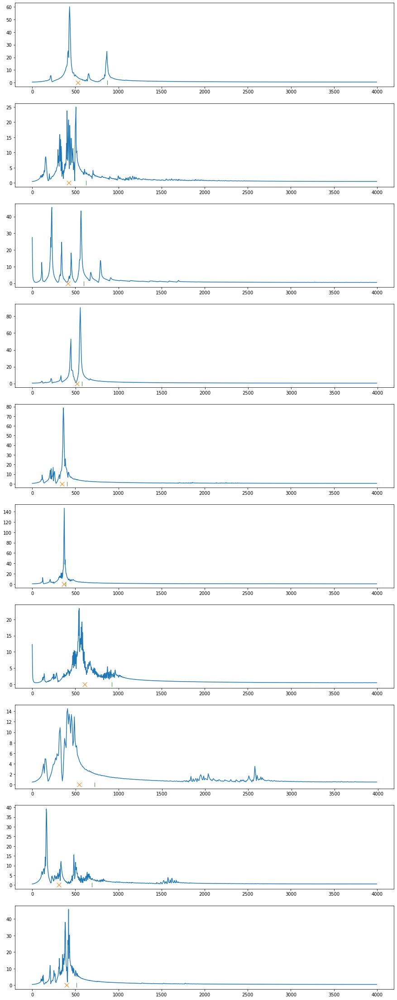

In [54]:
n_plot = 10
fig, ax = plt.subplots(n_plot,1,figsize=(15,4*n_plot))

for i in range(n_plot):
    sig = autocorrelation(X_d[i])
    
    fft = fftpack.fft(sig)
    freq = fftpack.fftfreq(fft.size, d=1/8000)
    fft = np.abs(fft[:fft.size//2])
    
    ax[i].plot(freq[:freq.size//2],fft)
    ax[i].plot(spectral_centroid(freq[:freq.size//2],np.where(fft/np.max(fft) < .1, 0, fft)),0,'x',markersize=10)
    ax[i].plot(spectral_rolloff(sig),0,'|',markersize=10)

## Rise time
Il tempo che il segnale impiega a passare dal 10% al 90% della sua energia. E' interessante perchè i segnali più impulivi avranno un tempo di salita piccolo e viceversa

In [55]:
def rise_time(sig, T=1/8000):
    sig = sig**2
    sig = sig / np.sum(sig)
    lower = 0
    upper = sig.size-1
    s = 0
    for i in range(sig.size):
        lower = i if s < .1 else lower
        upper = i if 1-s > .1 else upper
        s += sig[i]
    return (upper-lower)*T #upper,lower

TypeError: cannot unpack non-iterable float object

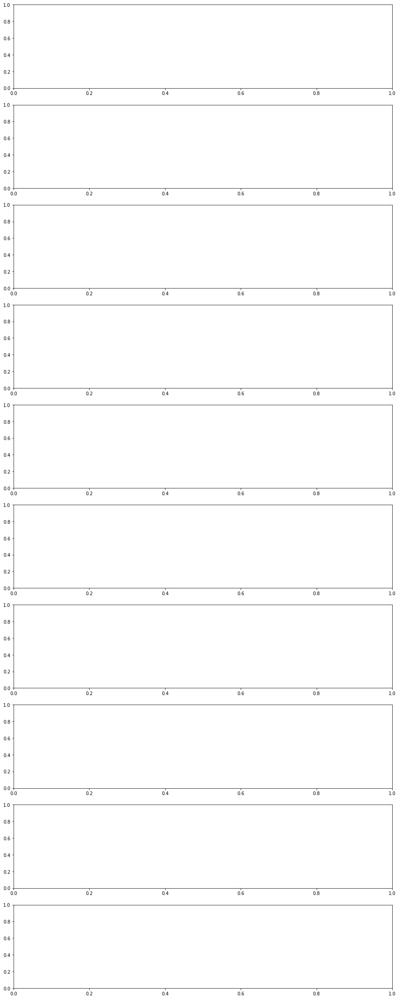

In [56]:
n_plot = 10
fig, ax = plt.subplots(n_plot,1,figsize=(15,4*n_plot))

for i in range(n_plot):
    sig = X_d[i]
    u,l = rise_time(sig)
    ax[i].plot(sig)
    ax[i].plot(l,0,'|',markersize=100)
    ax[i].plot(u,0,'|',markersize=100)

### centro di energia

Allo stesso modo posso calcolare il punto in cui l'energia raggiunge il 50%. Il tempo che un segnale impiega a raggiungere il 50% di energia è una casatteristica assoluta nel segnale (tempo dall'inizio). Il `rise_time()` invece è una carattereistica indipendente dalla posizione nel segnale.

In [57]:
def centro_energia(sig):
    sig = sig**2
    sig = sig / np.sum(sig)
    s = 0
    i = 0
    while s < .5 and i < sig.size:
        s += sig[i]
        i += 1
    return i

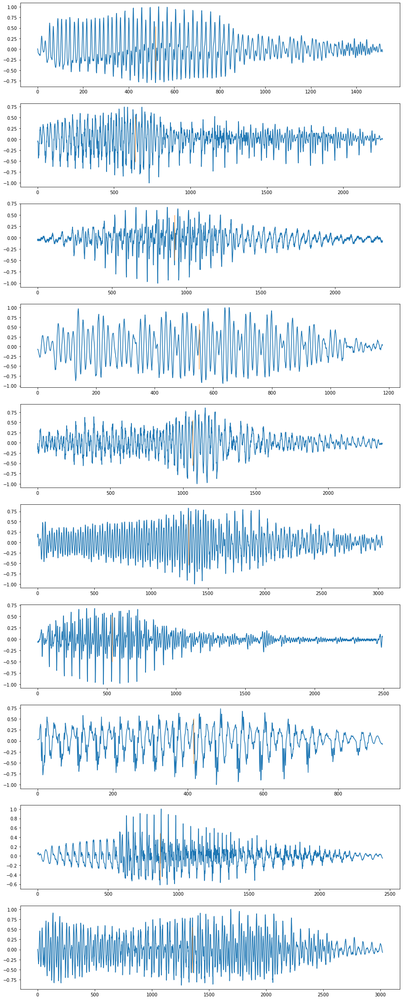

In [58]:
n_plot = 10
fig, ax = plt.subplots(n_plot,1,figsize=(15,4*n_plot))

for i in range(n_plot):
    sig = X_d[i]
    u = centro_energia(sig)
    ax[i].plot(sig)
    ax[i].plot(u,0,'|',markersize=100)

### Percentuale di energia
Estensione del concetto di centro ti energia: il centro è il 50% dell'energia

In [59]:
def perc_energia(sig, p):
    """Ritorna l'indice del segnale al quale la percentuale di energia vale 'p', in (0,1)"""
    sig = sig**2
    sig = sig / np.sum(sig)
    s = 0
    i = 0
    while s < p and i < sig.size:
        s += sig[i]
        i += 1
    return i

### Minima distanza tra due gobbe

In [60]:
def min_dist(sig):
    if sig.size < 2:
        return 0
    
    sig = np.sort(sig)
    return min([np.abs(sig[i]-sig[i-1]) for i in range(1,sig.size)])

### Framing del segnale
Una tecnica molto usata è quella di 'spezzare' il segnale e analizzare ciascun pezzo. Farò una prova calcolando la percentuale di energia per ogni frame.

In [61]:
def power(sig):
    """Potenza del segnale"""
    return np.abs(sig)**2

In [62]:
def ener_dist(sig, slots=10):
    """Distribuzione di energia"""
    power = np.abs(sig)**2
    dist = np.zeros(slots)
    slot_length = sig.size//(slots-1)
    
    for i in range(0,sig.size,slot_length):
        s = np.sum(power[i:i+slot_length])
        dist[i//slot_length] = s
        
    # Avanzi
    dist[-1] += np.sum(power[-(sig.size % slots)])
    
    return dist / np.sum(power)

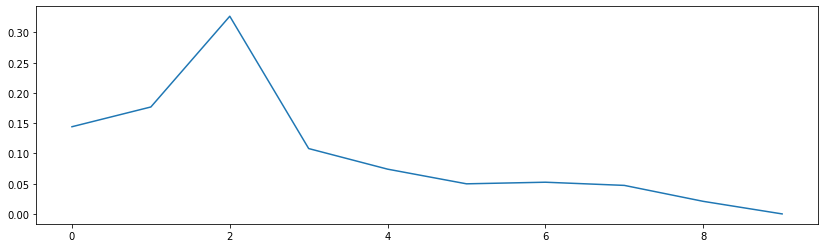

In [63]:
fig, ax = plt.subplots(figsize=(14,4))
ax.plot(ener_dist(X_d[1]));

## Features extraction

In [64]:
import scipy.stats as stats

def extract_features(sig):
    f = dict()
    t = 1/8000
    
    # TIME 
    
    # Signal length
    f['length'] = sig.size * t
    
    # Amplitude: mean, stddev, min, max
    f['avg_amp'] = np.average(sig)
    f['stddev_amp'] = np.std(sig)
    f['max_amp'] = np.max(sig)
    f['min_amp'] = np.min(sig)
    
    # abs(Amplitude): mean, stddev, min, max
    f['avg_abs_amp'] = np.average(np.abs(sig))
    f['stddev_abs_amp'] = np.std(np.abs(sig))
    f['max_abs_amp'] = np.max(np.abs(sig))
    f['min_abs_amp'] = np.min(np.abs(sig))
    
    # Signal kurtosis
    f['sig_kurtosis'] = stats.kurtosis(sig)
    
    # Signal skewness
    f['sig_skew'] = stats.skew(sig)
    
    # Linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(t*np.array(range(sig.size)),sig)
    f['sig_linreg_slope'] = slope
    f['sig_linreg_intercept'] = intercept
    f['sig_linreg_r_value'] = r_value
    f['sig_linreg_p_value'] = p_value
    f['sig_linreg_std_err'] = std_err
    
    # 'Gobbe'
    massimi = massimi_potenza(sig) # indici di sig corrispondenti ai massimi
    f['n_gob'] = massimi.size
    f['min_dist_gob'] = min_dist(massimi) * t
    
    # Zero crossing rate
    f['zero_crossing_rate'] = zero_crossing_rate(sig)
    
    # Rise time
    f['rise_time'] = rise_time(sig)
    
    # Energy center
    f['ener_center'] = centro_energia(sig) * t
    
    # Percentuale di energia
    p = range(5,96,10) # percentuali
    for i in p:
        f['ener_' + str(i) + '_perc'] = perc_energia(sig,i/100) * t
    
    #Energy distribution (%): riassume la forma del segnale
    slots = 10
    ener_d = ener_dist(sig, slots)
    for i,en in enumerate(ener_d):
        f['ener_dist_' + str(i+1)] = en
    
    # Numero di slot con % energia superiore alla media
    f['top_slots'] = len([i for i in ener_d if i > np.average(ener_d)]) / slots
    
    
    # FREQUENCY
    
    # FFT
    fft = fftpack.fft(sig)
    freq = fftpack.fftfreq(fft.size, d=t)
    power = np.abs(fft[:fft.size//2])
    
    # Power base statistics
    f['f_avg_power'] = np.average(power)
    f['f_stddev_power'] = np.std(power)
    f['f_min_power'] = np.min(power)
    f['f_max_power'] = np.max(power)
    
    # Power kurtosis
    f['f_power_kurtosis'] = stats.kurtosis(power)
    
    # Signal skewness
    f['f_power_skew'] = stats.skew(power)
    
    # Linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(freq[:freq.size//2],power)
    f['f_power_linreg_slope'] = slope
    f['f_power_linreg_intercept'] = intercept
    f['f_power_linreg_r_value'] = r_value
    f['f_power_linreg_p_value'] = p_value
    f['f_power_linreg_std_err'] = std_err
    
    # Spectral centroid & Spectrum stddev
    sp_centroid, sp_std = spectral_info(sig)
    f['spec_centroid'] = sp_centroid
    f['stddev_spec'] = sp_std
    
    # Spectral rolloff (freq. sotto la quale ho il 90% di energia)
    f['spec_rolloff'] = spectral_rolloff(sig)
    
    # Spectral rolloff a tante frequenze
    p = range(5,96,10) # percentuali
    for i in p:
        f['spec_rolloff_' + str(i) + '_perc'] = spectral_rolloff(sig,i/100)
    
    
    
    # PERCENTILES
    
    p = range(5,96,10)
    
    # Time
    
    # Percentili del segnale
    for i in p:
        f['time_' + str(i) + '_perc'] = np.percentile(sig,i)
        
    # Percentili della derivata del segnale
    for i in p:
        f['time_der_' + str(i) + '_perc'] = np.percentile(der(sig),i)

    # Frequency (no filtraggio o autocorr)
    for i in p:
        f['freq_' + str(i) + '_perc'] = np.percentile(power,i)
    
    # Frequency: percentili della derivata della potenza
    for i in p:
        f['freq_der_' + str(i) + '_perc'] = np.percentile(der(power),i)
        
    return f

In [65]:
extract_features(X_d[0])

{'length': 0.1895,
 'avg_amp': -0.0001862261481396496,
 'stddev_amp': 0.3262283575398377,
 'max_amp': 1.0,
 'min_amp': -0.7920772946859903,
 'avg_abs_amp': 0.2441028386422444,
 'stddev_abs_amp': 0.21642268852899135,
 'max_abs_amp': 1.0,
 'min_abs_amp': 9.66183574879227e-05,
 'sig_kurtosis': 0.5266601217598406,
 'sig_skew': 0.4722378128229826,
 'sig_linreg_slope': 0.007641790098479099,
 'sig_linreg_intercept': -0.0009098081480893892,
 'sig_linreg_r_value': 0.0012814211615631524,
 'sig_linreg_p_value': 0.9602402633801186,
 'sig_linreg_std_err': 0.15326391626329075,
 'n_gob': 1,
 'min_dist_gob': 0.0,
 'zero_crossing_rate': 201,
 'rise_time': 0.08737500000000001,
 'ener_center': 0.064625,
 'ener_5_perc': 0.013000000000000001,
 'ener_15_perc': 0.026375,
 'ener_25_perc': 0.039125,
 'ener_35_perc': 0.050875000000000004,
 'ener_45_perc': 0.060125,
 'ener_55_perc': 0.069,
 'ener_65_perc': 0.07875,
 'ener_75_perc': 0.0885,
 'ener_85_perc': 0.099875,
 'ener_95_perc': 0.128875,
 'ener_dist_1': 0.1

In [66]:
import pandas as pd

X_df = pd.DataFrame([extract_features(X_d[i]) for i in range(X_d.size)])
X_df

,length,avg_amp,stddev_amp,max_amp,min_amp,avg_abs_amp,stddev_abs_amp,max_abs_amp,min_abs_amp,sig_kurtosis,...,freq_der_5_perc,freq_der_15_perc,freq_der_25_perc,freq_der_35_perc,freq_der_45_perc,freq_der_55_perc,freq_der_65_perc,freq_der_75_perc,freq_der_85_perc,freq_der_95_perc
0,0.189500,-0.000186,0.326228,1.000000,-0.792077,0.244103,0.216423,1.0,0.000097,0.526660,...,-21055.422677,-2055.493980,-937.162412,-405.102435,-75.773410,143.747283,527.510025,1050.860672,2806.642803,24708.134425
1,0.282250,-0.000373,0.248947,0.737621,-1.000000,0.184893,0.166700,1.0,0.000000,0.803195,...,-43223.409852,-14142.569819,-5051.241636,-1756.667572,-402.046488,461.786717,2160.363739,5900.370529,13543.759659,46541.542152
2,0.290000,-0.030402,0.196933,0.666667,-1.000000,0.133822,0.147644,1.0,0.000000,3.640200,...,-18262.715930,-7469.825338,-4849.868531,-2487.645856,-891.107893,799.958063,2552.701267,4605.333361,7676.336632,19141.230634
3,0.147375,-0.000112,0.394771,1.000000,-0.942802,0.313718,0.239635,1.0,0.000048,-0.394984,...,-21007.261559,-4778.537229,-2575.101697,-1283.597310,-436.382260,289.591503,1188.906164,2461.395639,5217.667321,23308.016821
4,0.296750,-0.000332,0.246363,0.854836,-1.000000,0.181772,0.166294,1.0,0.000079,1.400172,...,-30448.844571,-9735.085301,-5291.529875,-2471.887612,-813.425266,617.312972,2653.925300,4837.829710,9877.176970,29596.582583
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1474,0.212000,-0.043548,0.301636,0.904762,-1.000000,0.222793,0.207952,1.0,0.000000,0.796990,...,-16320.454528,-7449.342171,-4710.088166,-2537.438929,-901.334635,917.746060,2439.563057,4387.331071,7036.760159,15037.273476
1475,0.293875,-0.081938,0.295101,0.818182,-1.000000,0.221685,0.211316,1.0,0.000000,0.917214,...,-39827.581208,-21971.784726,-13756.301054,-7851.838722,-2600.875102,2515.583639,8021.384329,14569.917146,22095.967732,39172.293680
1476,0.111500,-0.029073,0.293233,0.900000,-1.000000,0.219357,0.196757,1.0,0.000000,0.653792,...,-15284.664091,-5832.066651,-3529.188778,-1627.169020,-634.972260,741.731305,1974.364759,3661.307942,7265.531369,20628.912592
1477,0.168000,-0.000263,0.253556,1.000000,-0.604720,0.180689,0.177882,1.0,0.000000,1.207786,...,-21960.712713,-7575.734178,-3558.639528,-1873.496489,-546.406182,541.849172,1844.050730,3727.056299,8286.865934,23205.194394


In [67]:
X_df.describe()

,length,avg_amp,stddev_amp,max_amp,min_amp,avg_abs_amp,stddev_abs_amp,max_abs_amp,min_abs_amp,sig_kurtosis,...,freq_der_5_perc,freq_der_15_perc,freq_der_25_perc,freq_der_35_perc,freq_der_45_perc,freq_der_55_perc,freq_der_65_perc,freq_der_75_perc,freq_der_85_perc,freq_der_95_perc
count,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,...,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000,1479.000000
mean,0.279859,-0.008695,0.240222,0.815043,-0.951274,0.173580,0.165926,0.999950,0.000061,2.572152,...,-31749.524235,-10091.017599,-5098.919807,-2504.686502,-740.142495,711.033977,2461.458223,5040.878363,9975.775114,31437.213391
std,0.105590,0.016900,0.058821,0.169961,0.094981,0.054193,0.030486,0.001907,0.000187,2.800285,...,10100.377971,3767.215203,2094.240422,1110.733655,386.982664,370.629145,1109.820565,2093.157212,3770.536907,10225.608810
min,0.066750,-0.147195,0.102033,0.313577,-1.000092,0.050684,0.077023,0.926667,0.000000,-0.824186,...,-74187.239940,-31540.935625,-17932.476658,-9890.842646,-3955.985055,0.588956,192.148764,507.939396,1559.323714,8003.477907
25%,0.199875,-0.013110,0.192443,0.682699,-1.000000,0.129886,0.142336,1.000000,0.000000,0.559730,...,-37633.150126,-12120.381442,-6220.393327,-3125.642331,-925.018925,443.665313,1711.067822,3648.359979,7568.791921,24248.912070
50%,0.270875,-0.000258,0.235955,0.827586,-1.000000,0.169506,0.165315,1.000000,0.000000,1.628353,...,-30204.298753,-9610.590471,-4931.277544,-2419.718407,-684.157223,661.275776,2378.322479,4845.850223,9461.160623,30045.033385
75%,0.354812,0.000093,0.283074,1.000000,-0.948879,0.212246,0.188109,1.000000,0.000000,3.925444,...,-24528.490163,-7626.004068,-3680.319427,-1745.971714,-468.452129,920.378173,3054.484666,6222.666425,11954.500940,36877.871866
max,0.561375,0.003842,0.430772,1.000000,-0.485512,0.360998,0.256188,1.000092,0.001883,21.613519,...,-7383.099005,-1650.820822,-530.356159,-187.762566,-40.441810,2699.125389,10056.514404,18935.254253,31675.024781,74256.926324


In [68]:
X_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1479 entries, 0 to 1478
Columns: 106 entries, length to freq_der_95_perc
dtypes: float64(104), int64(2)
memory usage: 1.2 MB


### Features correlation

In [69]:
import seaborn as sns; sns.set()

def plot_heatmap(X_df):
    #compute the correlation matrix
    correlation_matrix = X_df.corr()
    feature_names = X_df.columns

    # Generate a mask for the upper triangle
    mask = np.zeros_like(correlation_matrix, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(15, 15))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    ax = sns.heatmap(correlation_matrix, mask=mask, cmap=cmap, vmax=1, vmin = -1, center=0,
                square=True, linewidths=.5);

    #build the heatmap
    #ax = sns.heatmap(
    #    correlation_matrix, 
    #    vmin=-1, vmax=1, center=0,
    #    cmap=sns.diverging_palette(20, 220, n=200),
    #    square=True
    #)

    ax.set_xticklabels(
        feature_names,
        rotation=45,
        horizontalalignment='right'
    );

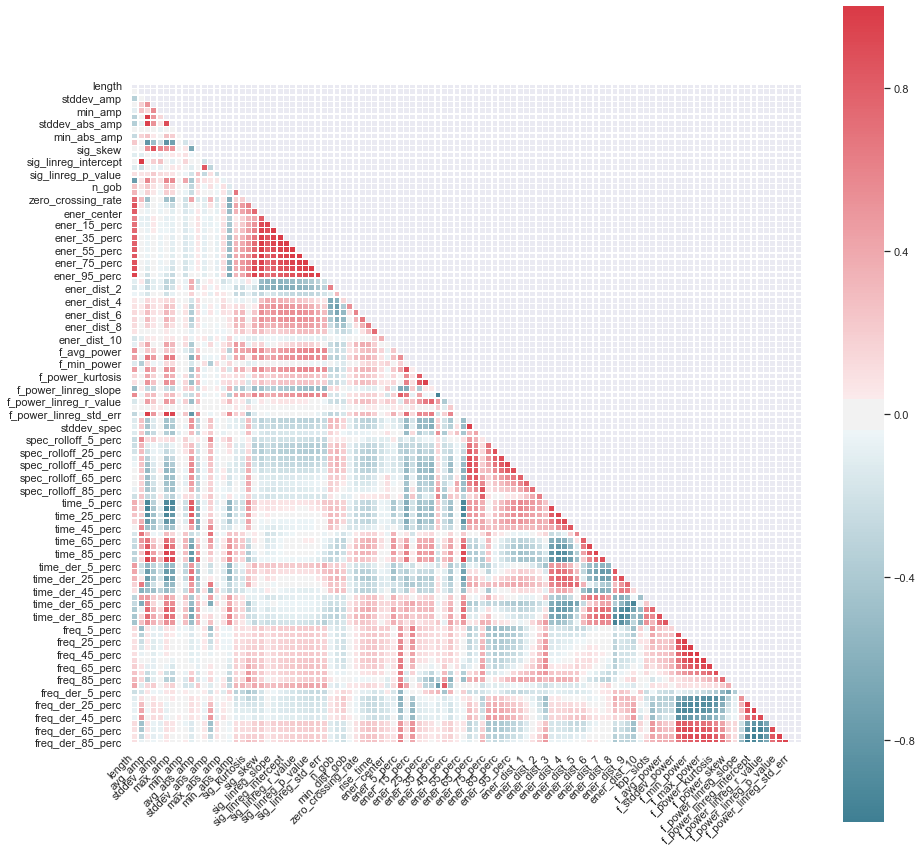

In [70]:
plot_heatmap(X_df)

## Riduzione features fortemente correlate

In [74]:
print('All the strongly correlated features:\n')

threshold = .85

correlation_matrix = X_df.corr()
feature_names = X_df.columns

# Lista di features correlate tra loro
correlated = []

for i in range(len(correlation_matrix)):
    for j in range(0,i):
        if correlation_matrix.iloc[i,j] > threshold or correlation_matrix.iloc[i,j] < -threshold:
            print(f'({feature_names[i]}, {feature_names[j]}) = {correlation_matrix.iloc[i,j]:.3f}')
            
            # Connessione
            correlated.append([feature_names[i], feature_names[j]])

All the strongly correlated features:

(avg_abs_amp, stddev_amp) = 0.988
(stddev_abs_amp, stddev_amp) = 0.955
(stddev_abs_amp, avg_abs_amp) = 0.901
(sig_skew, max_amp) = 0.856
(sig_linreg_intercept, avg_amp) = 0.995
(rise_time, length) = 0.859
(ener_15_perc, ener_center) = 0.908
(ener_15_perc, ener_5_perc) = 0.934
(ener_25_perc, ener_center) = 0.953
(ener_25_perc, ener_5_perc) = 0.887
(ener_25_perc, ener_15_perc) = 0.981
(ener_35_perc, ener_center) = 0.979
(ener_35_perc, ener_5_perc) = 0.850
(ener_35_perc, ener_15_perc) = 0.952
(ener_35_perc, ener_25_perc) = 0.987
(ener_45_perc, ener_center) = 0.998
(ener_45_perc, ener_15_perc) = 0.922
(ener_45_perc, ener_25_perc) = 0.965
(ener_45_perc, ener_35_perc) = 0.988
(ener_55_perc, ener_center) = 0.998
(ener_55_perc, ener_15_perc) = 0.896
(ener_55_perc, ener_25_perc) = 0.943
(ener_55_perc, ener_35_perc) = 0.972
(ener_55_perc, ener_45_perc) = 0.993
(ener_65_perc, ener_center) = 0.986
(ener_65_perc, ener_15_perc) = 0.868
(ener_65_perc, ener_25_pe

In [75]:
import numpy as np

def componenti_connesse(connessioni):
    """
    Restituisce le componenti connesse a partire da una lista di connessioni
    connessioni:lista di liste
    """
    elem = []
    for c in connessioni:
        elem.append(c[0])
        elem.append(c[1])
        
    # Vettore di elementi: possono essere qualsiasi oggetto
    elem = list(set(elem))
    
    # Vettore delle connessioni
    v = np.array([i for i in range(len(elem))])
    
    for c in connessioni:
        # Hashing
        i = elem.index(c[0])
        j = elem.index(c[1])
        
        # Verifica connessione
        if v[i] != v[j]:
            
            # Creazione connessione
            b = v[j]
            a = v[i]
            for k in range(v.size):
                if v[k] == a:
                    v[k] = b
   
    # Estrazione componenti connesse
    cc = list(set(v))
    elem = np.array(elem)
    cc_el = []
    for c in cc:
        cc_el.append(elem[v == c].tolist())
    
    return cc_el

In [76]:
# Componenti connesse della correlazione tra features
# Non sto differenziando correlazione positiva e negativa. lo devo fare?
comp_conn = componenti_connesse(correlated)
comp_conn

[['max_amp', 'sig_skew'],
 ['f_power_linreg_slope', 'f_power_linreg_intercept'],
 ['freq_der_65_perc',
  'freq_der_45_perc',
  'freq_der_75_perc',
  'freq_15_perc',
  'freq_5_perc',
  'freq_45_perc',
  'freq_der_35_perc',
  'freq_der_55_perc',
  'freq_75_perc',
  'freq_der_15_perc',
  'freq_65_perc',
  'freq_der_25_perc',
  'freq_35_perc',
  'freq_55_perc',
  'freq_der_85_perc',
  'freq_25_perc'],
 ['spec_rolloff_15_perc',
  'spec_rolloff_45_perc',
  'spec_rolloff_35_perc',
  'spec_centroid',
  'spec_rolloff_55_perc',
  'spec_rolloff_25_perc',
  'stddev_spec'],
 ['f_stddev_power', 'f_max_power'],
 ['time_der_85_perc',
  'time_der_75_perc',
  'time_der_15_perc',
  'time_der_25_perc'],
 ['spec_rolloff', 'spec_rolloff_85_perc'],
 ['avg_amp', 'sig_linreg_intercept'],
 ['ener_95_perc',
  'ener_55_perc',
  'rise_time',
  'ener_85_perc',
  'ener_75_perc',
  'ener_65_perc',
  'ener_35_perc',
  'ener_25_perc',
  'ener_15_perc',
  'ener_45_perc',
  'ener_5_perc',
  'ener_center',
  'length'],
 [

#### Per ogni componente connessa identifico un rappresentante: il più correlato all'interno della componente connessa e il meno correlato all'esterno (con le altre) 

In [77]:
def rapp_feature(comp_conn, correlation_matrix):
    corr = correlation_matrix.copy()

    #  Rimuovo la correlazione di un indice con sè stesso
    for c in corr.columns:
        corr.loc[c,c] = 0

    # Faccio il modulo della correlazione: positiva e negativa non si devono cancellare a vicenda
    corr = np.abs(corr)

    # Correlazione totale di ciscuna feature con le altre
    somma_corr = corr.sum()

    rappr_features = []
    # Per ciasscuna comp_conn
    for cc in comp_conn:
        # Lo score viene calcolato come: correlazione_interna(comp conn)/correlazione_totale
        f, f_score = max([(feat, f_corr/somma_corr[feat]) for feat,f_corr in corr.loc[cc,cc].sum().items()],\
                         key=lambda x: x[1])

        rappr_features.append(f)
    
    return rappr_features

### Funzione wrapper di tutto

In [78]:
def riduzione_correlate(X,threshold=.85):
    """Riceve un DataFrame X e ritorna X ridotto"""
    
    correlation_matrix = X.corr()
    feature_names = X.columns
    
    # Lista di features correlate tra loro
    correlated = []

    for i in range(len(correlation_matrix)):
        for j in range(i):
            if correlation_matrix.iloc[i,j] > threshold or correlation_matrix.iloc[i,j] < -threshold:
                # Connessione
                correlated.append([feature_names[i], feature_names[j]])
    
    # Componenti connesse della correlazione tra features
    # Non sto differenziando correlazione positiva e negativa. lo devo fare? Non credo
    comp_conn = componenti_connesse(correlated)
    
    # Feature rappresentante per ogni componente connessa
    best_feat = rapp_feature(comp_conn, correlation_matrix)
    
    # Rimozione delle features: tutte quelle delle componenti connesse meno il rappresentante
    bad_feat = []
    for i,cc in enumerate(comp_conn):
            bad_feat.extend(list(filter(lambda x: x != best_feat[i], cc)))
    
    # Drop delle colonne
    X_new = X.drop(columns=bad_feat) 
    
    return X_new

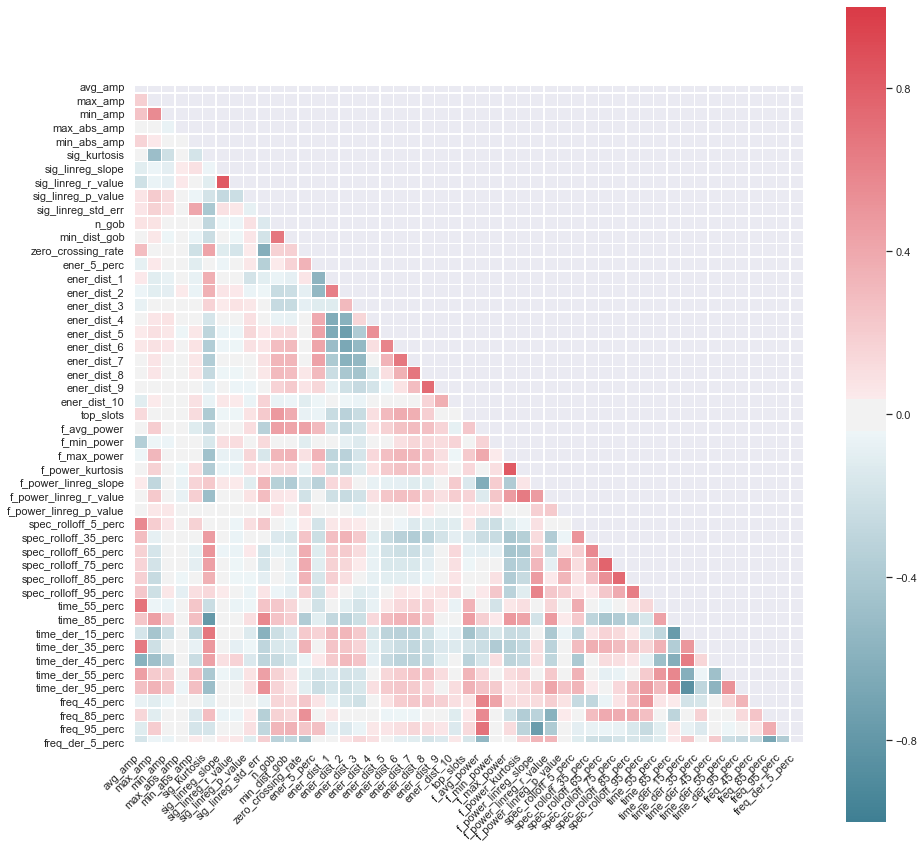

In [79]:
X_old = X_df.copy()
X_df = riduzione_correlate(X_df)
plot_heatmap(X_df)

## Spiegazione
Alcune features possono essere fortemente correlate tra loro, il chè può avere effetti negativi sulle performanecs (o comunque non le migliora).

***Riduzione - pipeline:***
1. Calcolo della matrice di correlazione con Pandas
2. Estrazione delle coppie di features con correlazione superiore a una certa soglia (default 85%).
3. Estrazione delle componenti connesse: si considerano le coppie come degli archi di un grafo. In questo modo ricavo le features che si 'muovono assieme'.
4. Per ogni componente connessa estraggo un rappresentante. Esso è la feature maggiormente correlata all'interno della componente connessa e meno correlata con le altre features (esterne). 
    Per fare questo prima rimuovo la diagonale della matrice di correlazione (che è tutta a 1 ed è inutile), poi faccio il modulo della stessa. Non voglio che sommando le correlazioni quelle positive si cancellino on quelle negative.

    Infine, lo score della feature è così calcolato:

    \begin{equation}
    \lambda = \frac{\sum_{j \in CC} corr_{j}}{\sum_{i=1}^{N_{feat}} corr_{i}}
    \end{equation}

    Ossia, per ogni feature di una componente connessa, è il rapporto **tra** la somma delle correlazioni che essa ha con le features della stessa componente connessa **e** la somma delle correlazioni che ha con tutte le features.
5. Ogni componenete connessa viene ridotta al suo rappresentante.

# Classification

In [80]:
import sklearn

In [81]:
X = X_df.values
X.shape

(1479, 49)

In [82]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X, y_d, test_size=.2)

## Random Forest

In [83]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=1000)
rf.fit(x_train,y_train)

# Performance assessment
from sklearn.metrics import classification_report

y_p = rf.predict(x_test)
print(classification_report(y_test, y_p))

              precision    recall  f1-score   support

           0       0.85      0.76      0.80        29
           1       0.96      0.96      0.96        25
           2       0.84      0.66      0.74        32
           3       0.75      0.73      0.74        33
           4       0.92      1.00      0.96        36
           5       0.97      0.91      0.94        33
           6       0.81      0.89      0.85        28
           7       1.00      1.00      1.00        28
           8       0.71      0.92      0.80        24
           9       0.96      0.96      0.96        28

    accuracy                           0.88       296
   macro avg       0.88      0.88      0.87       296
weighted avg       0.88      0.88      0.87       296



##### Features importance

In [84]:
rf.feature_importances_
sorted([(f, imp) for f,imp in zip(feature_names, rf.feature_importances_)], key=lambda x: -x[1])

[('ener_dist_7', 0.06390212523881576),
 ('sig_kurtosis', 0.05930189736306221),
 ('f_max_power', 0.05919576212720056),
 ('ener_dist_6', 0.055104829565660686),
 ('ener_dist_5', 0.04732507388421971),
 ('ener_dist_4', 0.046693755971308586),
 ('sig_linreg_intercept', 0.04463774266530178),
 ('ener_dist_3', 0.03757103483799033),
 ('zero_crossing_rate', 0.03283830078552791),
 ('min_dist_gob', 0.03249255370763029),
 ('ener_85_perc', 0.03225072783022498),
 ('sig_linreg_p_value', 0.029836525850097193),
 ('sig_linreg_r_value', 0.02798604582722595),
 ('ener_95_perc', 0.024568801232855306),
 ('f_power_kurtosis', 0.02308551400056288),
 ('avg_abs_amp', 0.022176251874682112),
 ('sig_linreg_std_err', 0.0215816992383811),
 ('ener_45_perc', 0.019782486563247013),
 ('ener_65_perc', 0.01784657489951148),
 ('ener_dist_10', 0.01765926274638604),
 ('ener_dist_2', 0.017291519856222348),
 ('f_min_power', 0.016302366871540123),
 ('ener_dist_9', 0.016242470019175306),
 ('top_slots', 0.01595465595550111),
 ('f_powe

### Cross validation

In [85]:
from sklearn.model_selection import GridSearchCV

params = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40],
    'max_leaf_nodes': [None, 10, 15, 20],
    'min_impurity_decrease': [0.0, 0.1, 0.01]
    #'max_features': ['sqrt', 'log2', None]
}

clf = RandomForestClassifier(n_estimators=100)

# Adesso la divisione tra training set e validation set è ciclica e
# la rotazione e la valutazione della miglior configurazione viene
# gestita dalla classe GridSearchCV.
gridsearch = GridSearchCV(clf, params, scoring='accuracy', cv=5, iid=False)

# Il fit viene sempre fatto su {validation + training} set!!
gridsearch.fit(x_train,y_train)

# Best accuracy sul validation set
#print(gridsearch.best_score_)

# Test delle performances
y_p = gridsearch.best_estimator_.predict(x_test)
#acc = accuracy_score(y_test, y_p)
print(classification_report(y_test, y_p))

              precision    recall  f1-score   support

           0       0.83      0.83      0.83        29
           1       0.96      0.96      0.96        25
           2       0.75      0.66      0.70        32
           3       0.65      0.67      0.66        33
           4       0.92      1.00      0.96        36
           5       0.97      0.91      0.94        33
           6       0.89      0.86      0.87        28
           7       1.00      1.00      1.00        28
           8       0.81      0.92      0.86        24
           9       0.96      0.96      0.96        28

    accuracy                           0.87       296
   macro avg       0.87      0.88      0.87       296
weighted avg       0.87      0.87      0.87       296



In [86]:
best_params = gridsearch.best_params_
best_params

{'criterion': 'entropy',
 'max_depth': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0}

In [87]:
rf = RandomForestClassifier(n_estimators=1000, **best_params)
rf.fit(x_train,y_train)

y_p = rf.predict(x_test)
print(classification_report(y_test, y_p))

              precision    recall  f1-score   support

           0       0.88      0.76      0.81        29
           1       0.96      0.96      0.96        25
           2       0.78      0.66      0.71        32
           3       0.68      0.70      0.69        33
           4       0.92      1.00      0.96        36
           5       0.97      0.91      0.94        33
           6       0.86      0.89      0.88        28
           7       1.00      1.00      1.00        28
           8       0.73      0.92      0.81        24
           9       0.96      0.96      0.96        28

    accuracy                           0.87       296
   macro avg       0.87      0.88      0.87       296
weighted avg       0.87      0.87      0.87       296



## SVM

In [88]:
from sklearn.svm import SVC

svml = SVC(gamma='scale')
svml.fit(x_train, y_train)
y_p = svml.predict(x_test)
print(classification_report(y_test, y_p))

              precision    recall  f1-score   support

           0       0.11      0.03      0.05        29
           1       0.00      0.00      0.00        25
           2       0.21      0.34      0.26        32
           3       0.18      0.18      0.18        33
           4       0.21      0.44      0.29        36
           5       0.48      0.30      0.37        33
           6       0.00      0.00      0.00        28
           7       0.17      0.29      0.21        28
           8       0.12      0.29      0.17        24
           9       0.00      0.00      0.00        28

    accuracy                           0.20       296
   macro avg       0.15      0.19      0.15       296
weighted avg       0.16      0.20      0.16       296



C:\Users\mette\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## Bayesian classificators
Naive Bayes assumption:

\begin{equation}
p(f_1,..., f_n|c) = \prod_{i=1}^n p(f_i|c)
\end{equation}

Dove $f_i$ è la feature i-esima e $c$ è una classe.   
$p(f_i|c)$ è la distribuzione di probabilità della feature i nella classe c.

- ***Multinomial Naive Bayes*** assume che le singole probabilità condizionate abbiano una distribuzione **multinomiale**. Questo rende il classificatore buono a lavorare con features che esprimono conteggi, come conteggi di parole o altri numeri interi.
- ***Gaussian Naive Bayes*** assume una distribuzione **gaussiana** per le singole probabilità condizionate.
Fonte: https://stats.stackexchange.com/questions/33185/difference-between-naive-bayes-multinomial-naive-bayes
- ***CategoricalNB*** the categorical naive Bayes algorithm for categorically distributed data. It assumes that each feature, which is described by the index , has its own categorical distribution.
Fonte: https://scikit-learn.org/stable/modules/naive_bayes.html

In questo caso un ***Gaussian Naive Bayes*** o un ***CategoricalNB*** dovrebbe andare.

In [89]:
from sklearn.naive_bayes import GaussianNB #, CategoricalNB

In [90]:
gaussnb = GaussianNB()
gaussnb.fit(x_train, y_train)
y_p = gaussnb.predict(x_test)
print(classification_report(y_test, y_p))

              precision    recall  f1-score   support

           0       0.51      0.83      0.63        29
           1       0.48      0.40      0.43        25
           2       0.67      0.12      0.21        32
           3       0.36      0.61      0.45        33
           4       0.85      0.92      0.88        36
           5       0.76      0.76      0.76        33
           6       0.76      0.68      0.72        28
           7       0.61      0.89      0.72        28
           8       0.53      0.33      0.41        24
           9       0.92      0.43      0.59        28

    accuracy                           0.61       296
   macro avg       0.64      0.60      0.58       296
weighted avg       0.65      0.61      0.59       296



In [94]:
#catenb = CategoricalNB()
#catenb.fit(x_train, y_train)
#y_p = catenb.predict(x_test)
#print(classification_report(y_test, y_p))

## KNN

In [95]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()
knn.fit(x_train, y_train)
y_p = knn.predict(x_test)
print(classification_report(y_test, y_p))

              precision    recall  f1-score   support

           0       0.33      0.52      0.41        29
           1       0.32      0.48      0.38        25
           2       0.38      0.34      0.36        32
           3       0.35      0.33      0.34        33
           4       0.45      0.39      0.42        36
           5       0.45      0.52      0.48        33
           6       0.35      0.25      0.29        28
           7       0.24      0.21      0.23        28
           8       0.17      0.17      0.17        24
           9       0.38      0.21      0.27        28

    accuracy                           0.35       296
   macro avg       0.34      0.34      0.33       296
weighted avg       0.35      0.35      0.34       296



## Logistic regression

In [ ]:
from sklearn.linear_model import LogisticRegression

lrclass = LogisticRegression(solver='lbfgs', multi_class='ovr', max_iter=100000)

lrclass.fit(x_train, y_train)
y_p = lrclass.predict(x_test)
print(classification_report(y_test, y_p))

## Furter improvements
- Cross validation
- Altri classificatori (SVM (meglio x attributi continui?), Bayes, logistic regressio, KNN))
- Guarda le features importances e medita
- Normalizzazione delle features
- Conversione delle features continue in bins (discretizzazione)
- Rimozione delle features fortemente correlate